In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# FIRSTLY TRY READING THE DATASET WE HAVE DOWNLOADED

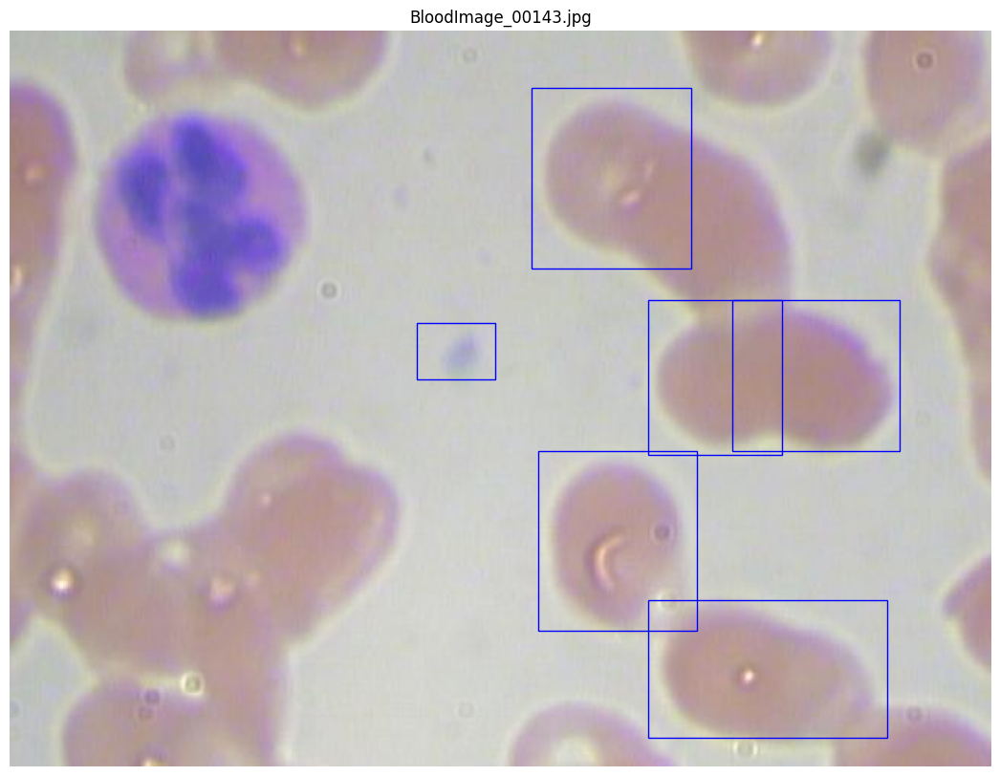

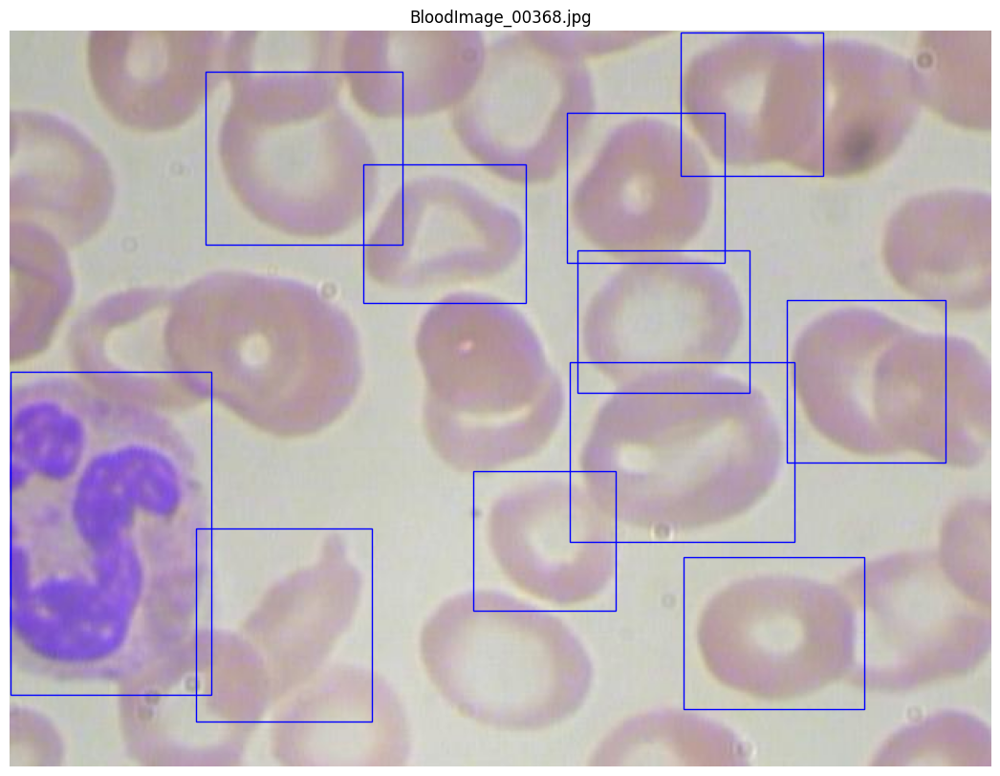

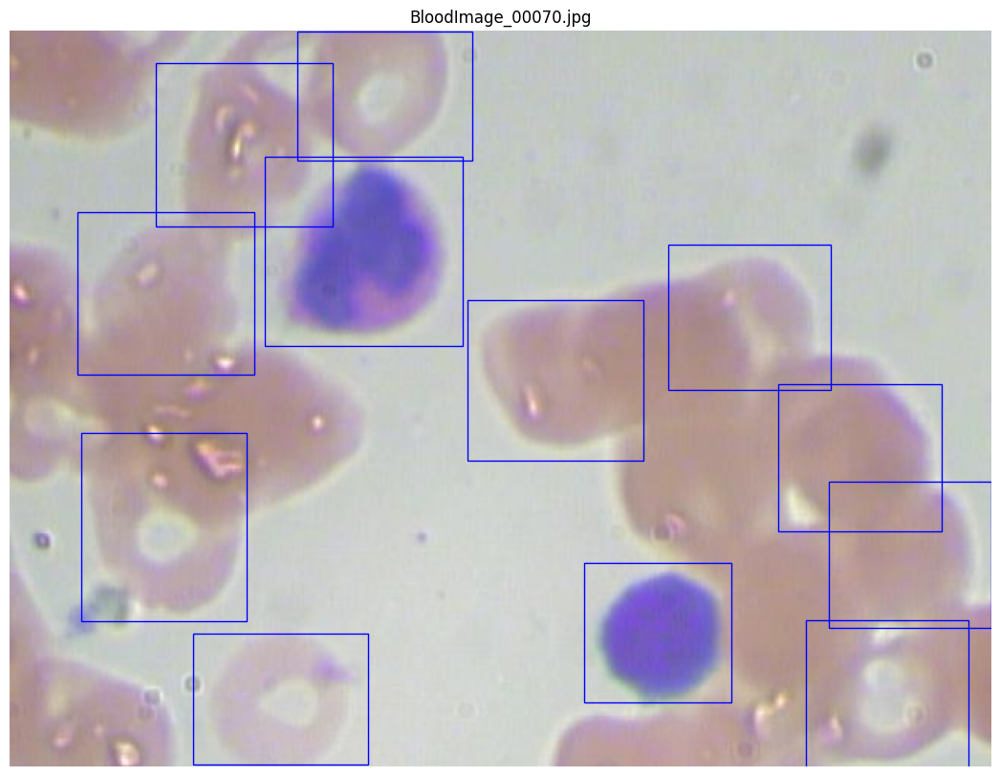

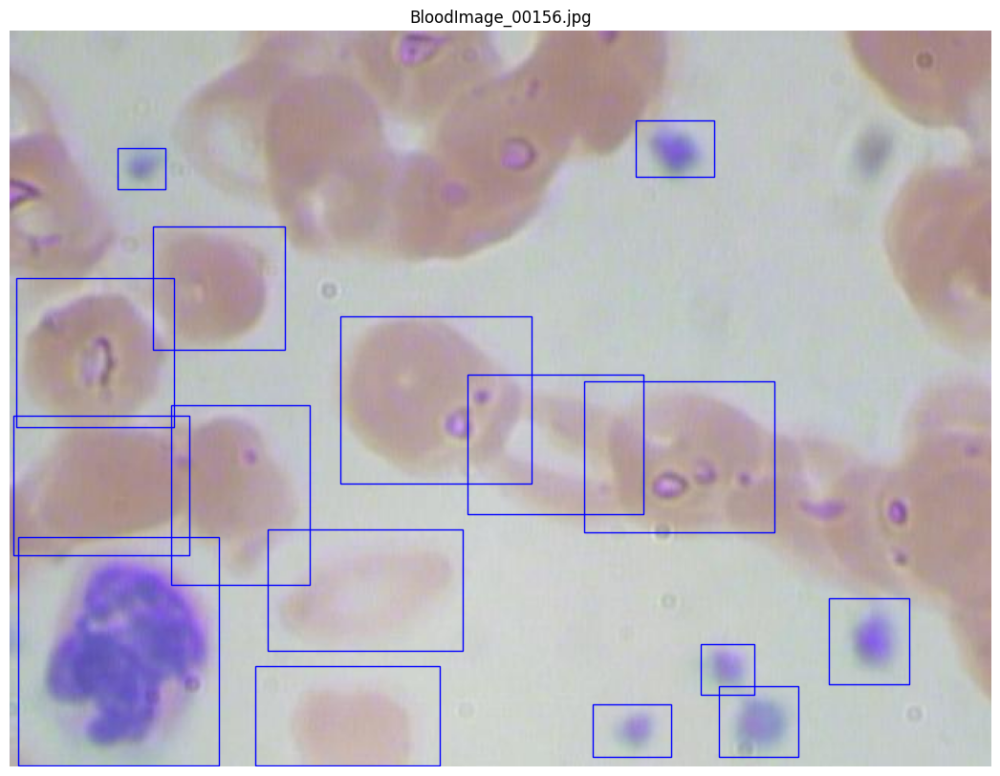

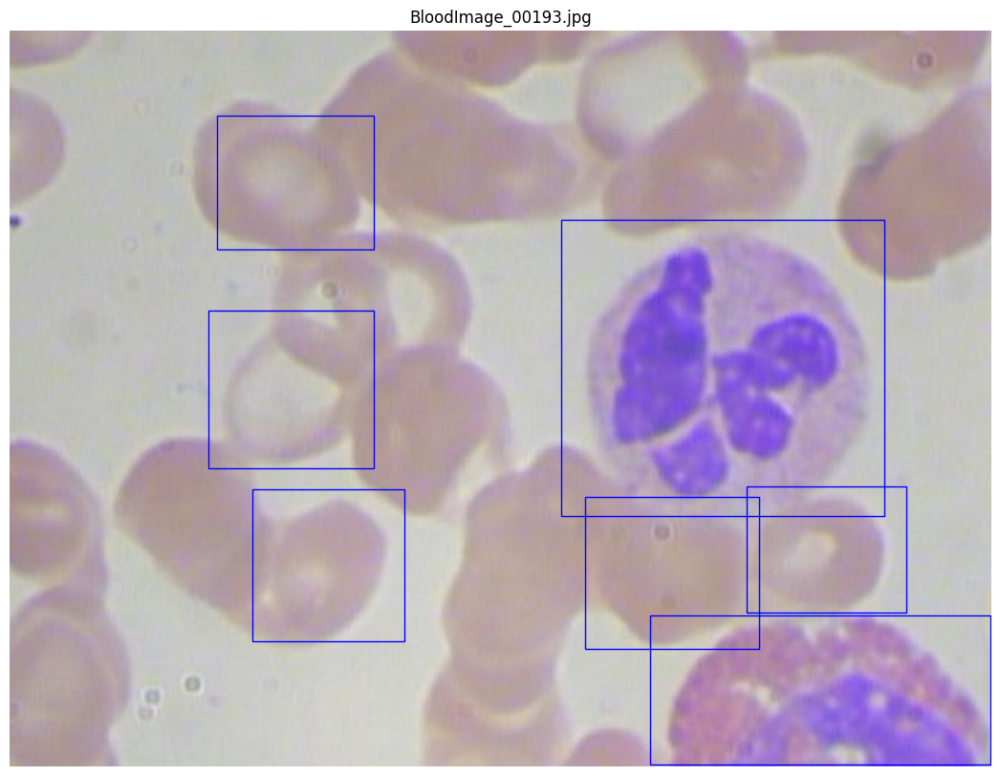

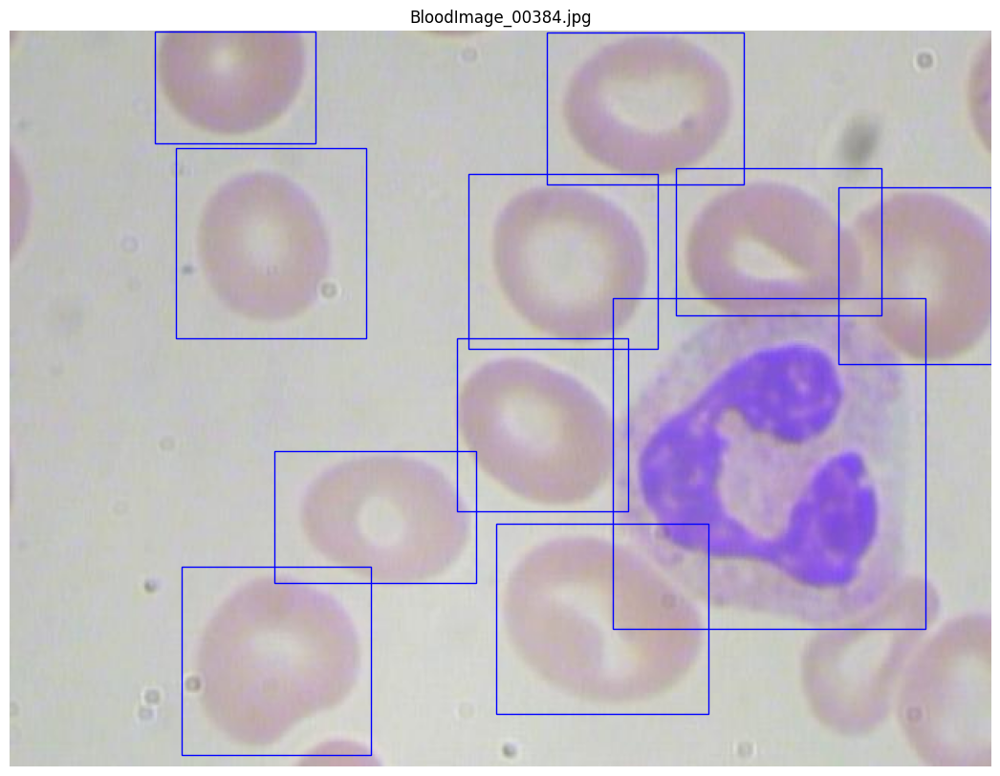

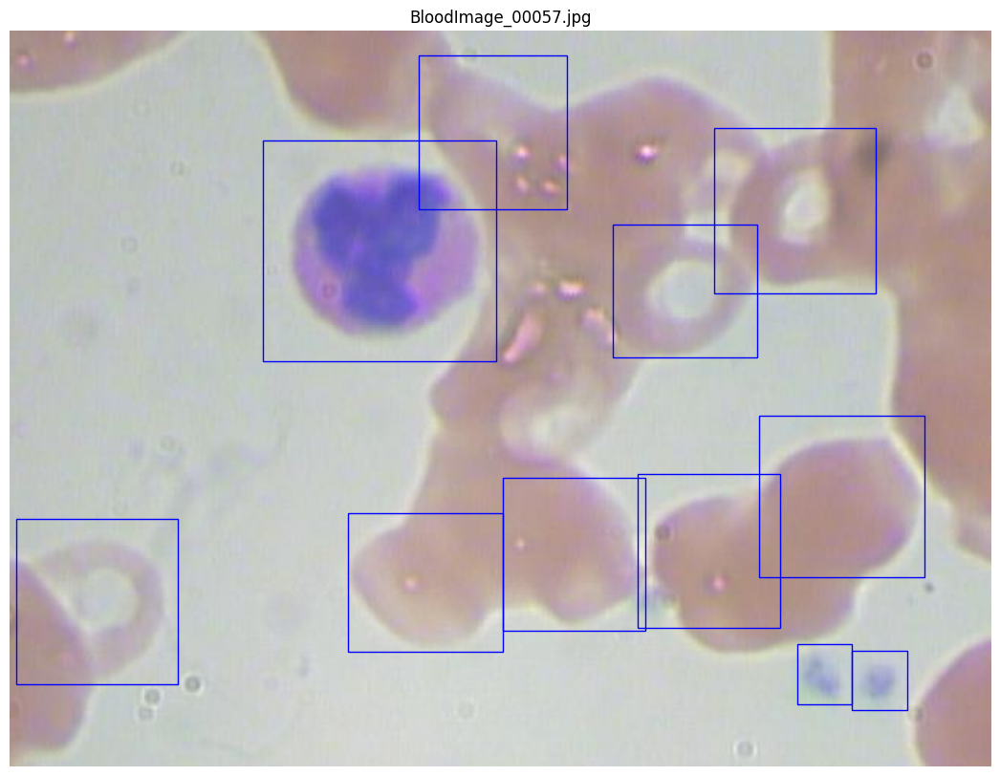

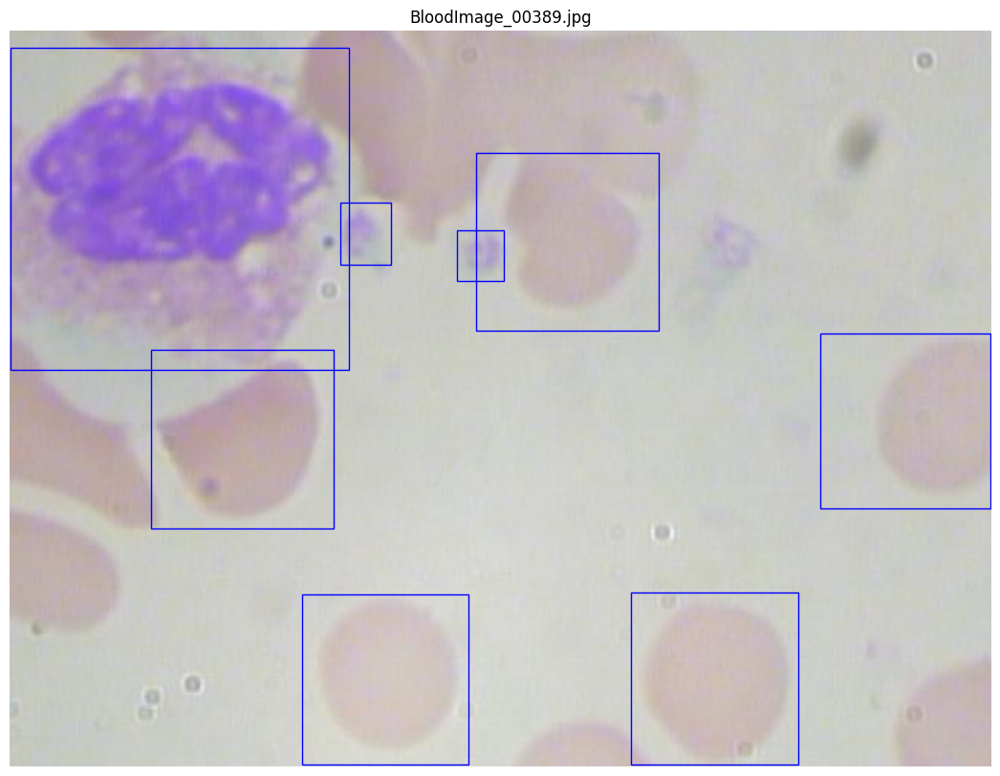

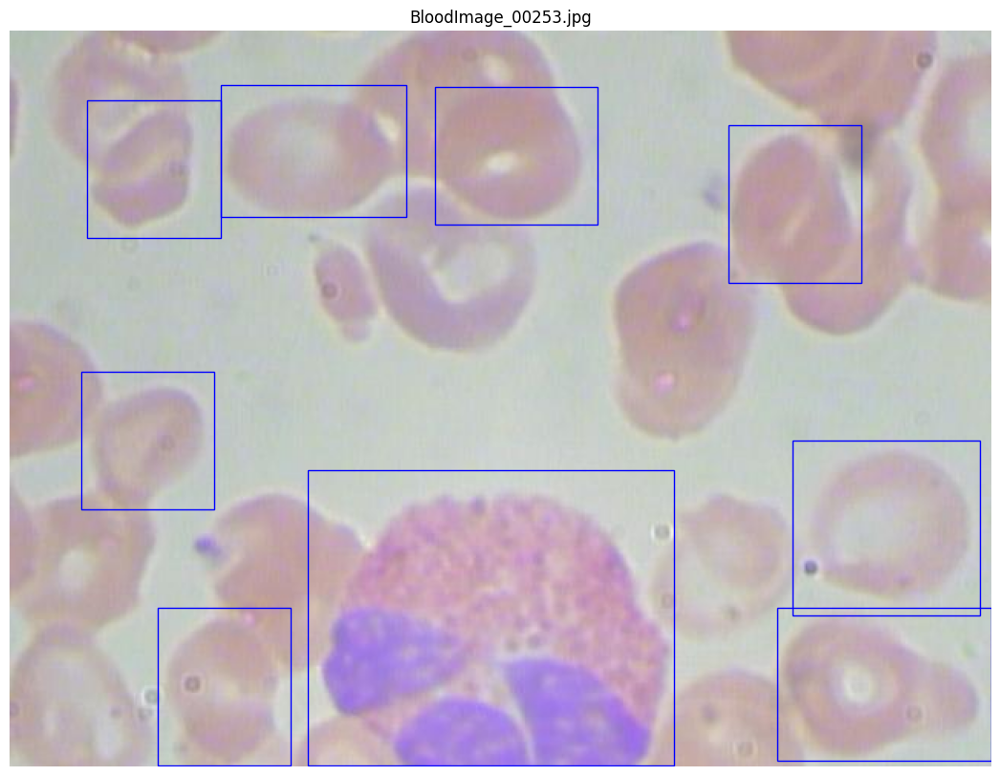

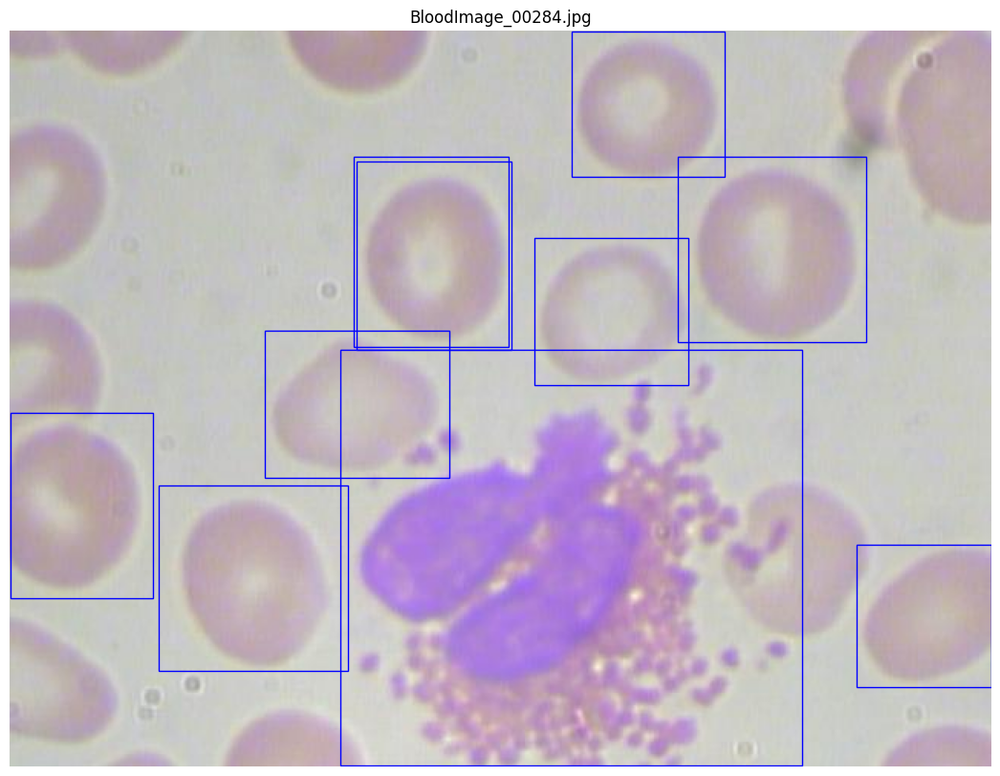

In [2]:
import cv2
import matplotlib.pyplot as plt
import os

def parse_txt_annotation(txt_file, image_width, image_height):
    annotations = []
    with open(txt_file, 'r') as f:
        for line in f:
            parts = line.strip().split()
            class_label = parts[0]
            bbox_values = list(map(float, parts[1:]))
            if len(bbox_values) >= 4:
                xmin = int((bbox_values[0] - bbox_values[2] / 2) * image_width)
                ymin = int((bbox_values[1] - bbox_values[3] / 2) * image_height)
                xmax = int((bbox_values[0] + bbox_values[2] / 2) * image_width)
                ymax = int((bbox_values[1] + bbox_values[3] / 2) * image_height)
                annotations.append({'xmin': xmin, 'ymin': ymin, 'xmax': xmax, 'ymax': ymax})
    return annotations

# Directory containing images and annotations
image_dir = '/content/drive/MyDrive/yolov5/bccd_dataset/images/train'
annotation_dir = '/content/drive/MyDrive/yolov5/bccd_dataset/labels/train'

# Get list of image files
image_files = os.listdir(image_dir)[:10]

# Plot each image with its annotations
for image_file in image_files:
    # Get the corresponding annotation file
    annotation_file = os.path.join(annotation_dir, os.path.splitext(image_file)[0] + '.txt')

    # Read image
    image = cv2.imread(os.path.join(image_dir, image_file))
    image_height, image_width, _ = image.shape

    # Parse annotations
    annotations = parse_txt_annotation(annotation_file, image_width, image_height)

    # Plot image with annotations
    plt.figure(figsize=(15, 10))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    current_axis = plt.gca()
    for annotation in annotations:
        xmin, ymin, xmax, ymax = annotation['xmin'], annotation['ymin'], annotation['xmax'], annotation['ymax']
        current_axis.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, color='blue', fill=False, linewidth=1))
    plt.axis('off')
    plt.title(image_file)
    plt.show()


## GENERATE ITS .CSV FILE AND READ ITS VALUES

In [ ]:
from sklearn import preprocessing, model_selection

img_width = 640
img_height = 480
def width(df):
  return int(df.xmax - df.xmin)
def height(df):
  return int(df.ymax - df.ymin)
def x_center(df):
  return int(df.xmin + (df.width/2))
def y_center(df):
  return int(df.ymin + (df.height/2))
def w_norm(df):
  return df/img_width
def h_norm(df):
  return df/img_height

df = pd.read_csv('/content/drive/MyDrive/yolov5/dataset/ds.csv')

le = preprocessing.LabelEncoder()
le.fit(df['type'])
print(le.classes_)
labels = le.transform(df['type'])
df['labels'] = labels

df['width'] = df.apply(width, axis=1)
df['height'] = df.apply(height, axis=1)

df['x_center'] = df.apply(x_center, axis=1)
df['y_center'] = df.apply(y_center, axis=1)

df['x_center_norm'] = df['x_center'].apply(w_norm)
df['width_norm'] = df['width'].apply(w_norm)

df['y_center_norm'] = df['y_center'].apply(h_norm)
df['height_norm'] = df['height'].apply(h_norm)

df.head(30)

In [ ]:
import os

import os

# Define the paths to train and valid directories containing images and labels
train_images_dir = '/content/drive/MyDrive/yolov5/dataset/train/images'
train_labels_dir = '/content/drive/MyDrive/yolov5/dataset/train/labels'
valid_images_dir = '/content/drive/MyDrive/yolov5/dataset/valid/images'
valid_labels_dir = '/content/drive/MyDrive/yolov5/dataset/valid/labels'

# Count the number of images and labels in the train and valid directories
train_images_count = len(os.listdir(train_images_dir))
train_labels_count = len(os.listdir(train_labels_dir))
valid_images_count = len(os.listdir(valid_images_dir))
valid_labels_count = len(os.listdir(valid_labels_dir))

# Print the shape of train and valid datasets
print("Shape of the train dataset:")
print("Images:", train_images_count)
print("Labels:", train_labels_count)

print("\nShape of the valid dataset:")
print("Images:", valid_images_count)
print("Labels:", valid_labels_count)

print("\nNo. of Training images", len(os.listdir('/content/drive/MyDrive/yolov5/dataset/train/images')))
print("No. of Training labels", len(os.listdir('/content/drive/MyDrive/yolov5/dataset/train/labels')))

print("No. of valid images", len(os.listdir('/content/drive/MyDrive/yolov5/dataset/valid/images')))
print("No. of valid labels", len(os.listdir('/content/drive/MyDrive/yolov5/dataset/valid/labels')))

## DOWNLOAD YOLO VERSION WE WANNA USE WITH ITS REQUIREMENTS

In [ ]:
!git clone 'https://github.com/ultralytics/yolov5'

In [ ]:
!pip install -qr '/content/yolov5/requirements.txt'  # install dependencies

## GENERATE ITS YAML FILE

In [ ]:
import os
import yaml

def create_yaml(dataset_dir, output_file):
    # Initialize dictionary to store dataset information
    dataset_info = {'train': {'dataset': []}, 'val': {'dataset': []}, 'nc': 713, 'names': []}

    # Function to iterate through directory and add image paths and label paths to dataset_info
    def process_directory(dir_path, mode):
        images_dir = os.path.join(dir_path, 'images')
        labels_dir = os.path.join(dir_path, 'labels')
        for filename in os.listdir(images_dir):
            if filename.endswith('.jpg'):  # Assuming image files have .jpg extension
                image_path = os.path.join(images_dir, filename)
                label_path = os.path.join(labels_dir, filename.replace('.jpg', '.txt'))
                dataset_info[mode]['dataset'].append({'image_path': image_path, 'label_path': label_path})

    # Process training and validation directories for both images and labels
    for mode in ['train', 'val']:
        mode_dir = os.path.join(dataset_dir, mode)
        process_directory(mode_dir, mode)

    # Add class names to dataset_info
    for i in range(1, 714):  # Assuming class indices start from 1
        dataset_info['names'].append(f'class_{i}')

    # Write dataset_info to YAML file
    with open(output_file, 'w') as yaml_file:
        yaml.dump(dataset_info, yaml_file)

    print("YAML file created:", output_file)

# Define paths
dataset_dir = '/content/drive/MyDrive/yolov5/dataset'  # Replace with the path to your BCD dataset directory
output_file = '/content/drive/MyDrive/yolov5/data/groceries.yaml'  # Replace with the desired output YAML file path

# Create YAML file
create_yaml(dataset_dir, output_file)

## START TRAINING THE MODEL

In [ ]:
!python /content/drive/MyDrive/yolov5/train.py --img 640 --batch 8 --epochs 10 --data /content/drive/MyDrive/yolov5/data/groceries.yaml --cfg /content/drive/MyDrive/yolov5/models/yolov5s.yaml --name BCCMG

## SAVE THE MODEL

In [ ]:
!python /content/drive/MyDrive/yolov5/detect.py --source '/content/drive/MyDrive/yolov5/dataset/val/images/' --weights '/content/drive/MyDrive/yolov5/runs/train/BCCMG/weights/best.pt' --project '/content/drive/MyDrive/yolov5/Final/exp2/'

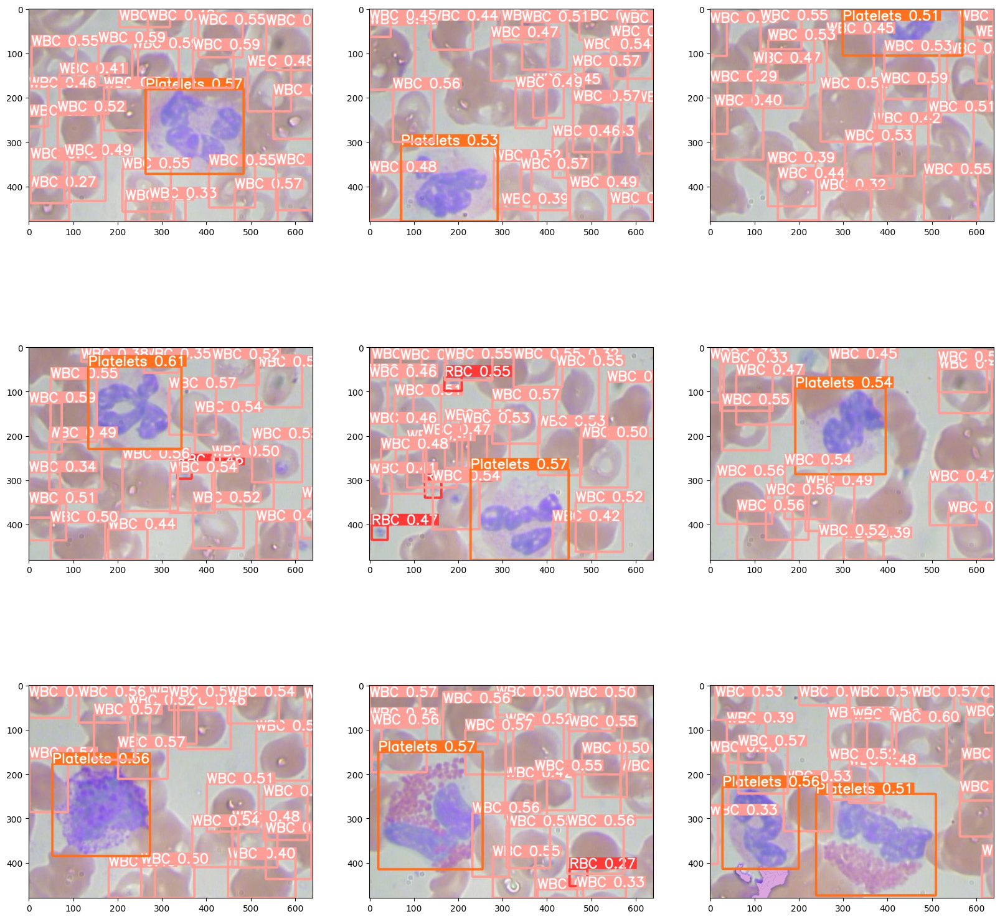

In [3]:
import os
import numpy as np
from PIL import ImageFile, Image
import numpy
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

folder_dir = '/content/drive/MyDrive/yolov5/Final/exp'
files = os.listdir(folder_dir)
i=0
fig, axes = plt.subplots(3, 3,figsize=(20,20))
for i, img_name in enumerate(files[:]):
  im = mpimg.imread(folder_dir + '/' + img_name)
  axes[i//3, i%3].imshow(im)
  if i==8:
    break
plt.show()